# Data mining \& clustering

The goal if this practical is to adress the folowing problem:
<center style="color:red" >  Given XXX raw, unlabeled documents, ... How to exploit/understand/represent them?</center>

In the previous week, we have seen how to represent textual data with the Bag of Words (BoW) model:
$$X =
	\begin{matrix}
	 & \textbf{t}_j \\
	 & \downarrow \\
	\textbf{d}_i \rightarrow &
	\begin{pmatrix}
	x_{1,1} & \dots & x_{1,d} \\
	\vdots & \ddots & \vdots \\
	x_{N,1} & \dots & x_{N,d} \\
	\end{pmatrix}
	\end{matrix}
	$$

From this BoW representation, we want to answer the following questions:
1. Which clustering algorithm to choose?
    - K-means, LSA, pLSA, LDA
1. What results to expect?
    - Semantics, noise cleaning, etc...
1. Which qualitative and quantitative analyses to understand the groups?
[comment]: <> (%1. Comment boucler, itérer pour améliorer la qualité du processus?)


<span style="color:magenta" > In this practical, we use a **labeled dataset** in order to evaluate performances with quantitative and well-defined metrics. </span>


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import codecs
import re
import os.path
import sklearn

from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import pandas as pd


## Data loading



In [ ]:
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')

In [ ]:
# conversion BoW + tf-idf
from sklearn.feature_extraction.text import TfidfVectorizer
#vectorizer = TfidfVectorizer()
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000, stop_words='english')

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)

# sparsity measure = 44 active words over 1000 per document (157 over 130000) !!
print(vectors.nnz / float(vectors.shape[0]))

(11314, 1000)
44.164928407283014


In [ ]:
# retrieve words
print([(i,vectorizer.get_feature_names_out()[i]) \
       for i in np.random.randint(vectors.shape[1], size=10)])

[(278, 'crime'), (274, 'court'), (324, 'display'), (98, 'al'), (421, 'given'), (952, 'video'), (602, 'mil'), (82, 'access'), (473, 'human'), (369, 'expect')]


In [ ]:
# labels (only for evaluation)
Y = newsgroups_train.target
print(Y[:10])
print([newsgroups_train.target_names[i] for i in Y[:20]]) # vraie classe

[ 7  4  4  1 14 16 13  3  2  4]
['rec.autos', 'comp.sys.mac.hardware', 'comp.sys.mac.hardware', 'comp.graphics', 'sci.space', 'talk.politics.guns', 'sci.med', 'comp.sys.ibm.pc.hardware', 'comp.os.ms-windows.misc', 'comp.sys.mac.hardware', 'rec.motorcycles', 'talk.religion.misc', 'comp.sys.mac.hardware', 'sci.space', 'misc.forsale', 'alt.atheism', 'comp.graphics', 'rec.autos', 'sci.electronics', 'comp.windows.x']


# 0) Word clouds
### Drawing word clouds from the raw corpus or words' frequencies :  [make word clouds !](https://github.com/amueller/word_cloud)

### Installation
If you are using pip:

`pip install wordcloud`

### If you are using conda, you can install from the conda-forge channel:

`conda install -c conda-forge wordcloud`

### Let's look at the most frequent words in this dataset

In [ ]:
data = np.array(newsgroups_train.data)
corpus = "".join(data)
words = corpus.split() # optional args to choose the splitting chars
print("Nb mots=",len(words))
# Lets find the most frequence words Your code here

Nb mots= 3252437


In [ ]:
def get_N_mostFreqWords(N=100):
  vectorizer2 = CountVectorizer(max_features=N)
  X = vectorizer2.fit_transform(newsgroups_train.data)
  words=vectorizer2.get_feature_names_out()
  dict_words_freq=dict(zip(words, X.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  return sorted_dict_words_freq

sorted_dict_words_freq=get_N_mostFreqWords()

### Plot the N frequent words and verify that its follows a Zipf law

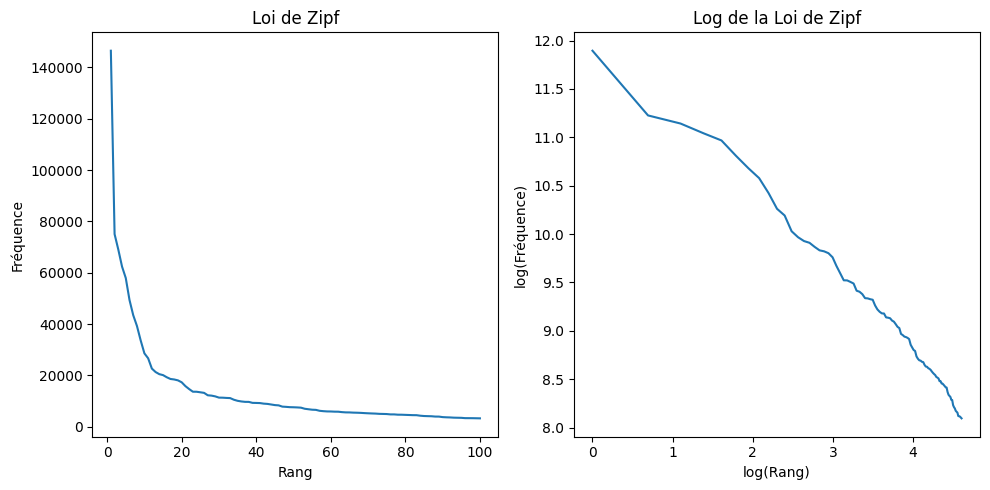

In [ ]:
# Your code here
def plotNfreqWords(N=100):
  #construire un dict avec comme clé le mot et valeur sa frequence
  sorted_dict_words_freq=get_N_mostFreqWords(N)

  #construire le plot
  rang=range(1,N+1)
  freq=list(sorted_dict_words_freq.values())
  fig, axis = plt.subplots(1, 2, figsize=(10, 5))
  axis[0].plot(rang,freq )
  axis[0].set_xlabel('Rang')
  axis[0].set_ylabel('Fréquence')
  axis[0].set_title('Loi de Zipf')

  axis[1].plot(np.log(rang), np.log(freq))
  axis[1].set_xlabel('log(Rang)')
  axis[1].set_ylabel('log(Fréquence)')
  axis[1].set_title('Log de la Loi de Zipf')

  plt.tight_layout()
  plt.show()
plotNfreqWords()

Nous pouvons remarquer que la courbe suit bien la loi de Zipf

### Experiment word clouds

(-0.5, 399.5, 199.5, -0.5)

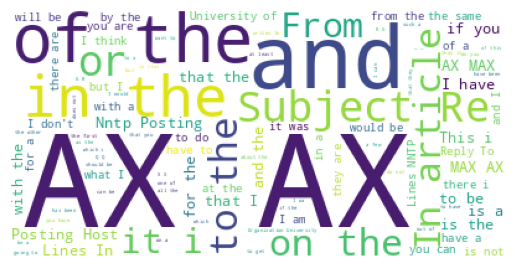

In [ ]:
wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus)

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

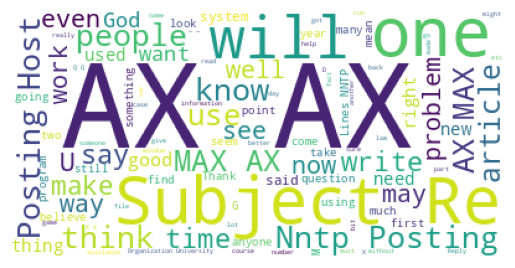

In [ ]:
from wordcloud import STOPWORDS # Note: this is the default option
wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate(corpus)

plt.figure()
plt.imshow(wordcloud)
plt.axis("off")

### Use word clouds with generate\_from\_frequencies.
N.B.: retrieve the most words frequencies using a CountVectorizer

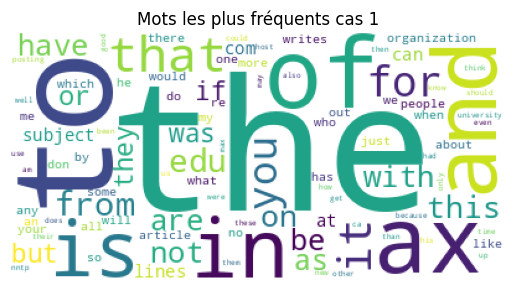

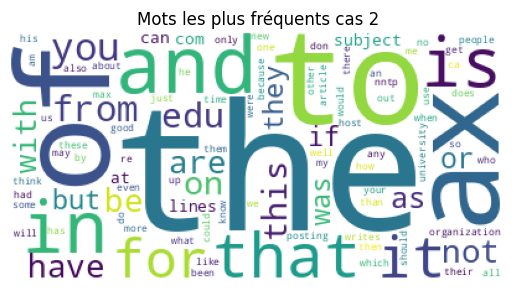

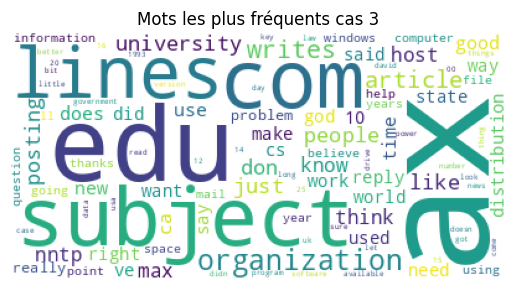

In [ ]:
# Your code here

# Cas1 : Sans elimination des STOPWORDS
wordcloud2= WordCloud(background_color='white', stopwords = [], max_words=100).generate_from_frequencies(frequencies=sorted_dict_words_freq)
plt.figure()
plt.imshow(wordcloud2)
plt.axis("off")
plt.title("Mots les plus fréquents cas 1")
plt.show()

# Avec elimination des STOPWORDS
## Cas2 : elimination par le constructeur wordcloud
wordcloud3= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate_from_frequencies(frequencies=sorted_dict_words_freq)
plt.figure()
plt.imshow(wordcloud3)
plt.axis("off")
plt.title("Mots les plus fréquents cas 2")
plt.show()

## Cas3 : elimination par le constructeur de count vectorizer
N=100
vectorizer3 = CountVectorizer(max_features=N, stop_words='english')
X = vectorizer3.fit_transform(newsgroups_train.data)
words=vectorizer3.get_feature_names_out()
dict_words_freq=dict(zip(words, X.sum(axis=0).tolist()[0]))
sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

wordcloud3= WordCloud(background_color='white', stopwords = [], max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
plt.figure()
plt.imshow(wordcloud3)
plt.axis("off")
plt.title("Mots les plus fréquents cas 3")
plt.show()

Nous remarquons que l'elimination des stopwords par le constructeur du CountVectorizer est meilleure que celle effectuée par wordCloud

### Drawing word clouds from classes


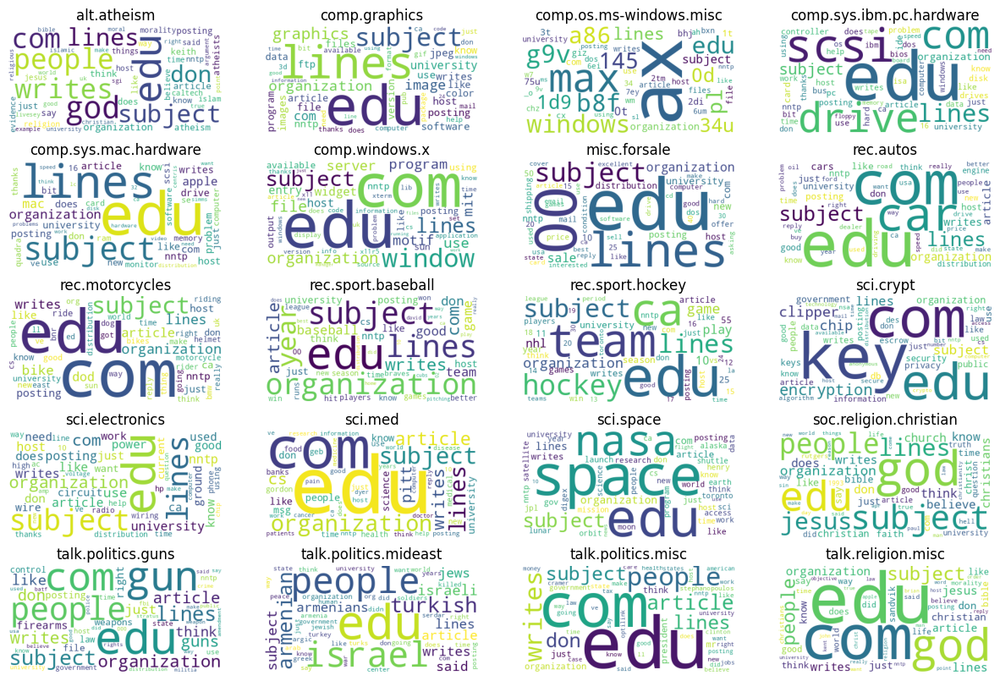

In [ ]:
# Your code here
N=50
X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(newsgroups_train.target)
classes=newsgroups_train.target_names
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre=str(classe)
  ax[i].set_title(titre)

# 1) Clustering algorithm: K-Means

**Let's start by the most famous and simple unsupervised algorithm: $k$-means!**
Look at [sklear documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
and apply it to your BoW matrix.


In [ ]:
from sklearn.cluster import KMeans
# your code here
kmeans = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(vectors) #Note : 20 clusters car 20 classes
# Getting clusters:
kmeans.cluster_centers_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([[0.00481251, 0.00431009, 0.00048919, ..., 0.00481887, 0.01265084,
        0.00097928],
       [0.00369518, 0.01008388, 0.00139004, ..., 0.01172087, 0.00496925,
        0.00488701],
       [0.00390038, 0.00431445, 0.0023992 , ..., 0.00616613, 0.00405261,
        0.00336554],
       ...,
       [0.00050777, 0.00514748, 0.00089056, ..., 0.00369742, 0.00111354,
        0.        ],
       [0.00836867, 0.0035352 , 0.        , ..., 0.00816881, 0.0031431 ,
        0.01436739],
       [0.0015631 , 0.00515836, 0.00593669, ..., 0.00522794, 0.00822491,
        0.00154939]])

### Clustering Analysis:
1. **Qualtitative:**
    - Look at the most important words for each cluster
    - Perform cluster assignement to each document, and compute word cloud on the document (raw text or frequencies)
2. **Quantitative:**
    - Compute cluster "purity": $p_j= |y^*_j|$, where $y^*_j$ is the most frequent (GT) label in cluster $C_j$ $\rightarrow$ $p = \frac{1}{N}\sum\limits_j  p_j$
    - Compute [Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.rand_score.html) and [Adjusted Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html#sklearn.metrics.adjusted_rand_score)

## Analyse qualitative

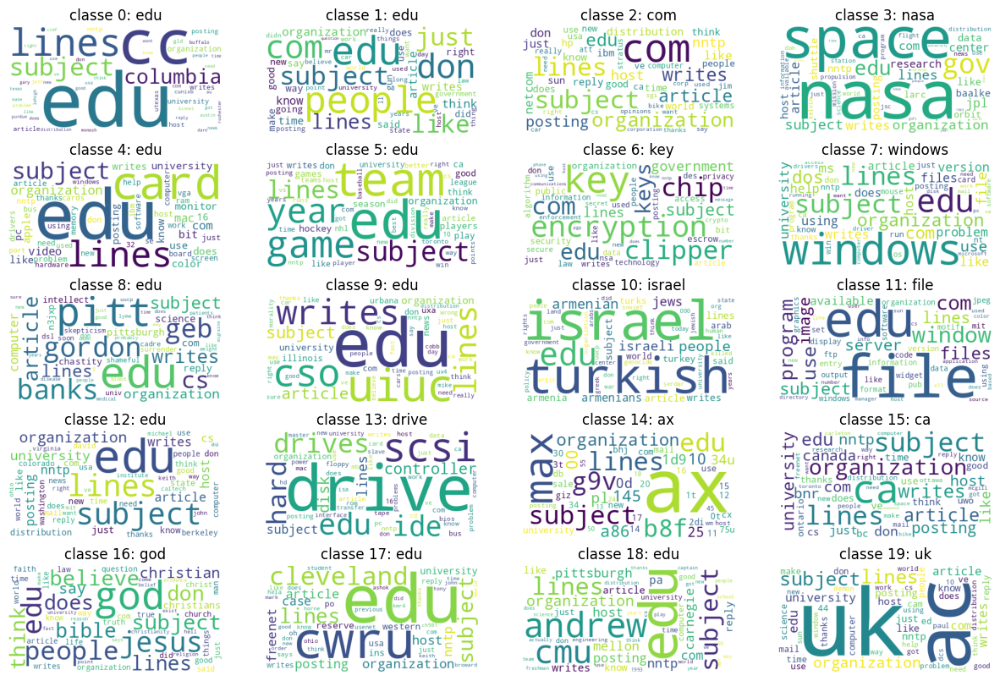

In [ ]:
kmeans_label_pred=kmeans.predict(vectors) # associer chaque document à un cluster (classe) par l'algorithme kmeans entrainé sur ces memes données

X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(kmeans_label_pred)
classes=set(kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  ## Analyser les mots les plus importants de chaque cluster
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  ## Donner un nom a chaque classe : nous prenons le mot le pls fréqeunt de la classe
  nom_classe=list(sorted_dict_words_freq.keys())[0]

  sorted_dict_words_freq
  ## Appliquer un wordcloud pour chaque classe
  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre="classe "+str(classe)+": "+nom_classe
  ax[i].set_title(titre)

En analysant les mots affichés par les wordcloud nous pouvons dire que le clustering des documents effectué par kmeans est bon. En effet, nous pouvons par exemple remarquer que des mots comme god, jesus, bible et christian ont été regroupés dans un meme cluster, ce qui montre que kmeans a réussi à identifier les documents de label soc.religion.christian.

## Analyse quantitative

In [ ]:
from sklearn.metrics import adjusted_rand_score, rand_score
import numpy as np


def get_purity(y_true, y_pred, nb_clusters):
    purity = 0
    for cluster in range(nb_clusters):
        cluster_indices = np.where(y_pred == cluster)[0] #recuperer les indices des documents qui ont été affectés au ieme cluster
        cluster_labels = y_true[cluster_indices]  #recuperer les vrais labels (classes) des documents
        majoritaire_label = np.argmax(np.bincount(cluster_labels)) #compter le nombre d'occurrences de chaque classe dans le cluster actuel et retourner la plus frequente (classe majoritaire)
        purity += np.sum(cluster_labels == majoritaire_label)
    purity /= len(y_true)
    return purity


pred_label= kmeans_label_pred
true_label = newsgroups_train.target

purity = get_purity(true_label, pred_label, 20)
print("Kmeans Cluster Purity:", purity)

rand= rand_score(true_label, pred_label)
print("Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, pred_label)
print("Kmeans Adjusted Rand Score:", adjusted_rand)


Kmeans Cluster Purity: 0.3102351069471451
Kmeans Rand Score: 0.8852879124091465
Kmeans Adjusted Rand Score: 0.11120721708814237


# 2) Latent Semantic Analysis (LSA <=> SVD)


**Remember the LSA factorziation**:
$$
\begin{matrix}
 & X  &\!\!\!\!\!=\!\!\!\!\!& U  & \Sigma & V^T \\
  & \textbf{t}_j   &  & \hat{ \textbf{d}_i} & &  \\
 & \downarrow  &  &\downarrow  & & \\
\textbf{d}_i \rightarrow
&
\begin{pmatrix}
x_{1,1} & \dots & x_{1,d} \\
\\
\vdots & \ddots & \vdots \\
\\
x_{N,1} & \dots & x_{N,d} \\
\end{pmatrix}
&
\!\!\!\!\!=\!\!\!\!\!
%&
%(\hat{ \textbf{t}_j}) \rightarrow
&
\begin{pmatrix}
\begin{pmatrix} &  \textbf{u}_1 &  \end{pmatrix} \\
\vdots \\
\begin{pmatrix}  & \textbf{u}_k &  \end{pmatrix}
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix}
\sigma_1 & \dots & 0 \\
\vdots & \ddots & \vdots \\
0 & \dots & \sigma_k \\
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix}
\begin{pmatrix} \, \\ \, \\ \textbf{v}_1 \\ \, \\ \,\end{pmatrix}
\dots
\begin{pmatrix} \, \\ \, \\ \textbf{v}_k \\ \, \\ \, \end{pmatrix}
\end{pmatrix}
\end{matrix}
$$

- Look at [SVD doc in skelarn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html#sklearn.decomposition.TruncatedSVD)
- Do the same qualitative/quantitative evaluation than with K-Means
- You can also use LSA as a pre-processing step for K-Means, *i.e.* running K-Means on $\boldsymbol{U}$ matrix above
    - N.B. : try without/with $\ell_2$ normalization of $\boldsymbol{U}$'s rows before running  K-Means
    - You can also benefit from LSA pre-processing for using [t-SNE visualization](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (see code below)


In [ ]:
from sklearn.decomposition import TruncatedSVD

## construire la matrice U et V

lsa_model = TruncatedSVD(n_components=20, algorithm='arpack', random_state=42)
lsa_model.fit(vectors)

#matrice sigma (composantes singulières)
sigma = lsa_model.singular_values_

#matrice U (vecteurs latent des documents)
U = lsa_model.transform(vectors)

#matrice de la transposée de V (les colonnes de VT sont vus comme une représentation latente des vecteurs de mots, et ses les lignes comme des champs lexicaux)
VT = lsa_model.components_

print("Matrice U :", U.shape)
print("Matrice transposée de V :", VT.shape)
print("Matrice sigma :", sigma.shape)
print("Pourcentage d'information retenue après la décomposition en SVD : ",np.round(lsa_model.explained_variance_ratio_.sum(),4)*100, " %")

Matrice U : (11314, 20)
Matrice transposée de V : (20, 1000)
Matrice sigma : (20,)
Pourcentage d'information retenue après la décomposition en SVD :  12.06  %


In [ ]:
"""Note : les valeurs singulières de la décomposition représentent l'importance de chaque mode de variation des données.
Elles quantifient la quantité de variance expliquée (pour représenter l'information retenue) par chaque composant principal extrait lors de la décomposition.
Ainsi, elle permettent de mesurer la contribution de chaque composante à la variance totale des données. Les premières valeurs singulières sont généralement les plus importantes car elles capturent la majorité de la variance dans les données.
Les valeurs singulières plus petites captent moins de variance et peuvent être considérées comme du bruit ou des informations moins importantes.
"""

"Note : les valeurs singulières de la décomposition représentent l'importance de chaque mode de variation des données.\nElles quantifient la quantité de variance expliquée (pour représenter l'information retenue) par chaque composant principal extrait lors de la décomposition.\nAinsi, elle permettent de mesurer la contribution de chaque composante à la variance totale des données. Les premières valeurs singulières sont généralement les plus importantes car elles capturent la majorité de la variance dans les données.\nLes valeurs singulières plus petites captent moins de variance et peuvent être considérées comme du bruit ou des informations moins importantes.\n"

## Analyse qualitative

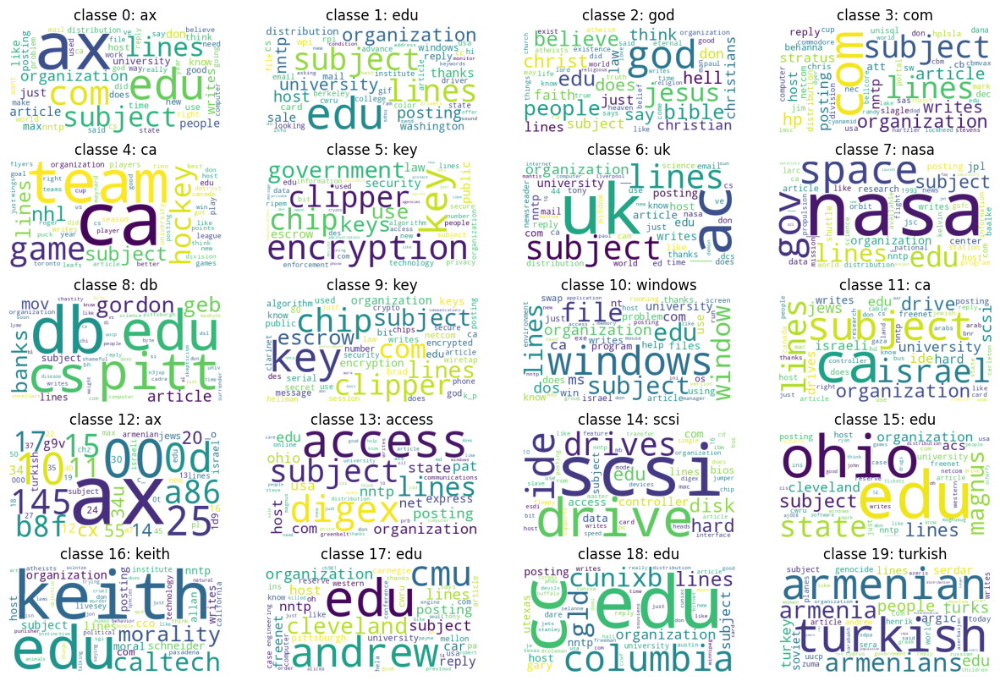

In [ ]:
## Affecter chaque document à une classe
lsa_label_pred=np.argmax(U, axis=1) # recuperer l'indice correspondant aux champs lexical auquel correspond le plus chaque document

X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(lsa_label_pred)
classes=set(lsa_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  ## Analyser les mots les plus importants de chaque cluster
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  ## Donner un nom a chaque classe : nous prenons le mot le pls fréqeunt de la classe
  nom_classe=list(sorted_dict_words_freq.keys())[0]

  sorted_dict_words_freq
  ## Appliquer un wordcloud pour chaque classe
  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre="classe "+str(classe)+": "+nom_classe
  ax[i].set_title(titre)

## Analyse quantitative

In [ ]:
pred_label= lsa_label_pred
true_label = newsgroups_train.target

purity = get_purity(true_label, pred_label, 20)
print("LSA Cluster Purity:", purity)

rand= rand_score(true_label, pred_label)
print("LSA Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, pred_label)
print("LSA Adjusted Rand Score:", adjusted_rand)

LSA Cluster Purity: 0.15582464203641505
LSA Rand Score: 0.40239070686996103
LSA Adjusted Rand Score: 0.0044782688724802015


En se basant sur les scores obtenus, nous remarquons qu'un clustering (ou classification non supervisée) avec la méthode LSA est moins performante que l'algorithme Kmeans.

## Utiliser LSA comme prétraitement des données pour un clustering avec Kmeans

##### Analyse qualitative

In [ ]:
kmeans_u = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(U) # remplacer vectors par U (sa représentation latente après décomposition en SVD)

lsa_kmeans_label_pred=kmeans_u.predict(U) # remplacer vectors par U (sa représentation latente après décomposition en SVD)

X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(lsa_kmeans_label_pred)
classes=set(lsa_kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  ## Analyser les mots les plus importants de chaque cluster
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  ## Donner un nom a chaque classe : nous prenons le mot le pls fréqeunt de la classe
  nom_classe=list(sorted_dict_words_freq.keys())[0]

  ## Appliquer un wordcloud pour chaque classe
  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre="classe "+str(classe)+": "+nom_classe
  ax[i].set_title(titre)

##### Analyse quantitative

In [ ]:
pred_label= lsa_kmeans_label_pred
true_label = newsgroups_train.target

purity = get_purity(true_label, pred_label, 20)
print("LSA_Kmeans Cluster Purity:", purity)

rand= rand_score(true_label, pred_label)
print("LSA_Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, pred_label)
print("LSA_Kmeans Adjusted Rand Score:", adjusted_rand)

Un clustering avec LSA et kmeans combinés donne de meilleurs scores que les deux approches étudiées séparement

#### Tester avec une normalisation l2

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(




LSA_l2Norm_Kmeans Cluster Purity: 0.34435213010429555
LSA_l2Norm_Kmeans Rand Score: 0.908882625845537
LSA_l2Norm_Kmeans Adjusted Rand Score: 0.1568278770698951


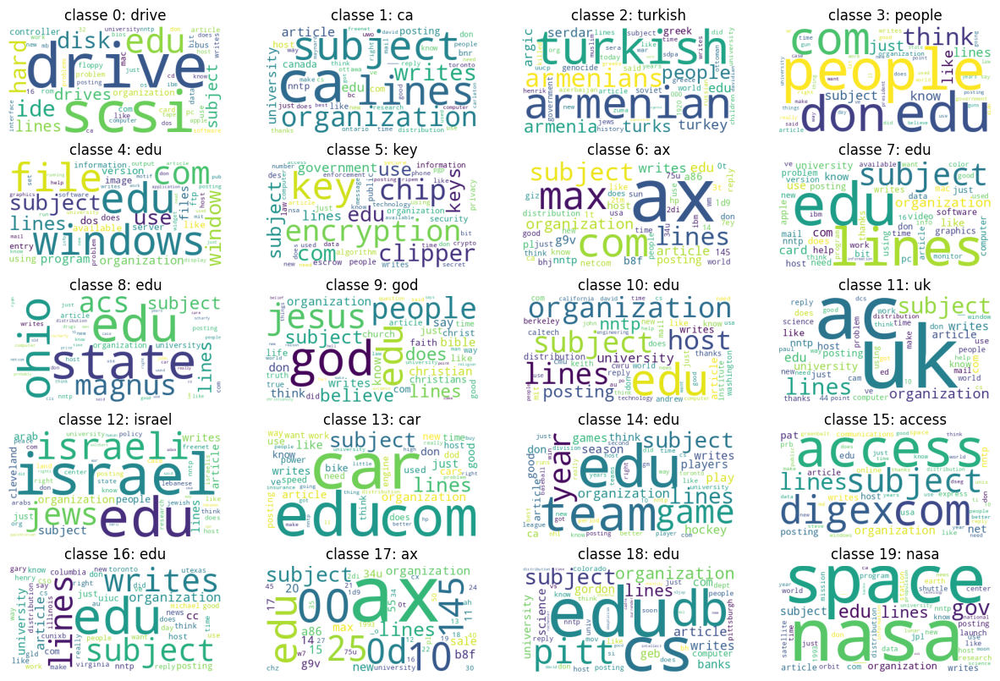

In [ ]:
from sklearn.preprocessing import Normalizer

#normalisation ℓ2 des lignes de la matrice U
normalizer = Normalizer(norm='l2', copy=False)
U_normalized = normalizer.fit_transform(U)

#appliquer K-Means sur U_normalized
kmeans_l2 = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(U_normalized)
lsa_l2_kmeans_label_pred = kmeans_l2.labels_

#Analyse qualitative
print()
X = pd.DataFrame(newsgroups_train.data)
Y = pd.DataFrame(lsa_l2_kmeans_label_pred)
classes = set(lsa_l2_kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
    ## Analyser les mots les plus importants de chaque cluster
    X_classe = X[Y.iloc[:,0]==i]
    vectorizer = CountVectorizer(max_features=N, stop_words='english')
    X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
    X_names = vectorizer.get_feature_names_out()
    dict_words_freq = dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
    sorted_dict_words_freq = dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

    ## Donner un nom à chaque classe : nous prenons le mot le plus fréquent de la classe
    nom_classe = list(sorted_dict_words_freq.keys())[0]

    ## Appliquer un wordcloud pour chaque classe
    wordcloud = WordCloud(background_color='white', stopwords=STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
    ax[i].imshow(wordcloud)
    ax[i].axis("off")
    titre = "classe "+str(classe)+": "+nom_classe
    ax[i].set_title(titre)

#Analyse quantitative
print()
true_label = newsgroups_train.target

purity = get_purity(true_label, lsa_l2_kmeans_label_pred, 20)
print("LSA_l2Norm_Kmeans Cluster Purity:", purity)

rand = rand_score(true_label, lsa_l2_kmeans_label_pred)
print("LSA_l2Norm_Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, lsa_l2_kmeans_label_pred)
print("LSA_l2Norm_Kmeans Adjusted Rand Score:", adjusted_rand)


La normalisation L2 améliore significativement les résultats obtenus (scores). Cela est du au fait que cette normalisation met toutes les caractéristiques à la même échelle, ainsi donner à chaque caractéristique une importance égale dans le calcul des distances. Aussi, cette norme favorise la stabilité du modèle car permet de réduire l'impact des valeurs extrêmes (outliers).

#### Tester avec une normalisation l1

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(




LSA_l1Norm_Kmeans Cluster Purity: 0.21177302457132754
LSA_l1Norm_Kmeans Rand Score: 0.8069601190456379
LSA_l1Norm_Kmeans Adjusted Rand Score: 0.07335831740974463


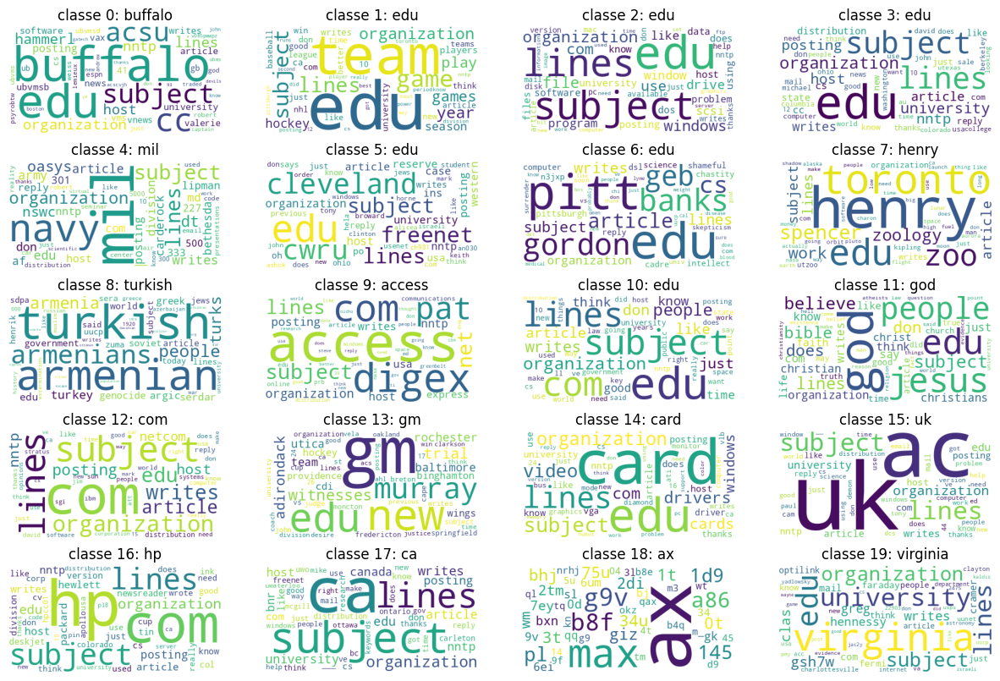

In [ ]:
from sklearn.preprocessing import Normalizer

# normalisation ℓ1 des lignes de la matrice vectors (sparse)
normalizer = Normalizer(norm='l1', copy=False)
vectors_normalized = normalizer.fit_transform(vectors)

# appliquer K-Means sur U_normalized
kmeans_l1 = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(vectors_normalized)
lsa_l1_kmeans_label_pred = kmeans_l1.labels_

#Analyse qualitative
print()
X = pd.DataFrame(newsgroups_train.data)
Y = pd.DataFrame(lsa_l1_kmeans_label_pred)
classes = set(lsa_l1_kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
    ## Analyser les mots les plus importants de chaque cluster
    X_classe = X[Y.iloc[:,0]==i]
    vectorizer = CountVectorizer(max_features=N, stop_words='english')
    X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
    X_names = vectorizer.get_feature_names_out()
    dict_words_freq = dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
    sorted_dict_words_freq = dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

    ## Donner un nom à chaque classe : nous prenons le mot le plus fréquent de la classe
    nom_classe = list(sorted_dict_words_freq.keys())[0]

    ## Appliquer un wordcloud pour chaque classe
    wordcloud = WordCloud(background_color='white', stopwords=STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
    ax[i].imshow(wordcloud)
    ax[i].axis("off")
    titre = "classe "+str(classe)+": "+nom_classe
    ax[i].set_title(titre)

# Analyse quantitative
print()
true_label = newsgroups_train.target

purity = get_purity(true_label, lsa_l1_kmeans_label_pred, 20)
print("LSA_l1Norm_Kmeans Cluster Purity:", purity)

# Compute Rand Score and Adjusted Rand Score
rand = rand_score(true_label, lsa_l1_kmeans_label_pred)
print("LSA_l1Norm_Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, lsa_l1_kmeans_label_pred)
print("LSA_l1Norm_Kmeans Adjusted Rand Score:", adjusted_rand)


A travers ces résultats nous pouvons déduire que pour ce dataset, appliquer une normalisation l1 directement sur la matrice vectors (sparse - resultante du tfidf) est moins performante si on doit comparer cette approche à celle où on applique une LSA puis une normalisation L2. Cela est du au fait que LSA fait deja une sélection de variables, la norme L2 apporte en plus une stabilité au modèle en réduisant la sensibilité aux valeurs aberrantes.

#### Visualisation avec TSNE

In [ ]:
# t-SNE from the U matrix computed by LSA
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.001s...
[t-SNE] Computed neighbors for 11314 samples in 1.802s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.178837
[t-SNE] Computed cond

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-52-4e09c3354217>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('hsv', 20)
<ipython-input-52-4e09c3354217>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet', 20)


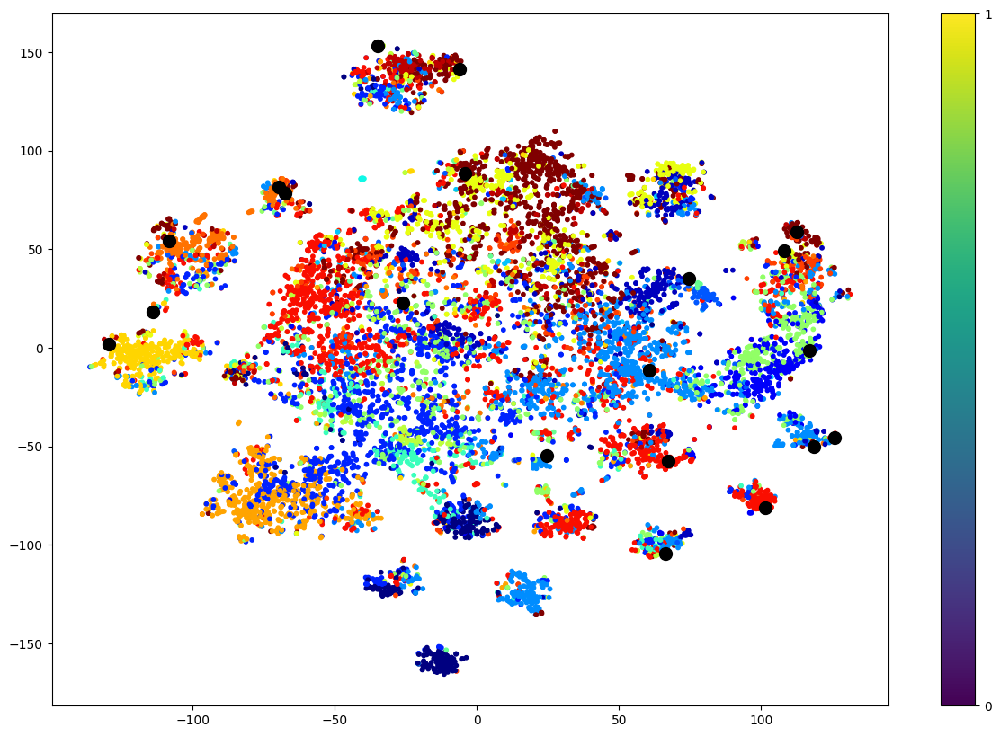

In [ ]:
NN2cluster = np.argmax(np.abs(U_normalized), axis=0)
#import seaborn as sns
import matplotlib.cm as cm
cmap = cm.tab20
cmap = cm.get_cmap('hsv', 20)
cmap = cm.get_cmap('jet', 20)
#cmap = cm.tab20

plt.figure(figsize=(15,10))
plt.scatter(tsne_mat[:,0],tsne_mat[:,1], c=Y, cmap=cmap, s=10)
plt.scatter(tsne_mat[NN2cluster[:],0],tsne_mat[NN2cluster[:],1], c='black', s=100)
#plt.scatter(tsne_mat[NN2cluster2[:],0],tsne_mat[NN2cluster2[:],1], c='red', s=100)
plt.colorbar(ticks=range(20))

# 3) Latent Dirichlet Allocation (LDA)

Perform the same experiments with LDA:
- LDA
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html


**Start with a CountVectorizer**

In [ ]:
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import CountVectorizer

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
vectorizer = CountVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1),
                        tokenizer = tokenizer.tokenize, max_df=0.95, min_df=2, max_features=1000)

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)
print(vectors.nnz / float(vectors.shape[0]))



/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(11314, 1000)
48.02527841612162


In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

# Construire la matrice de co-occurrence
lda_model = LatentDirichletAllocation(n_components=20, random_state=42)
lda_model.fit(vectors)

# Matrice de distribution de topics-document
U_lda = lda_model.transform(vectors)

# Matrice de distribution de mots-topic (transposée de V)
VT_lda = lda_model.components_

# Affecter chaque document à une classe
lda_label_pred = np.argmax(U_lda, axis=1)


## Analyse qualitative

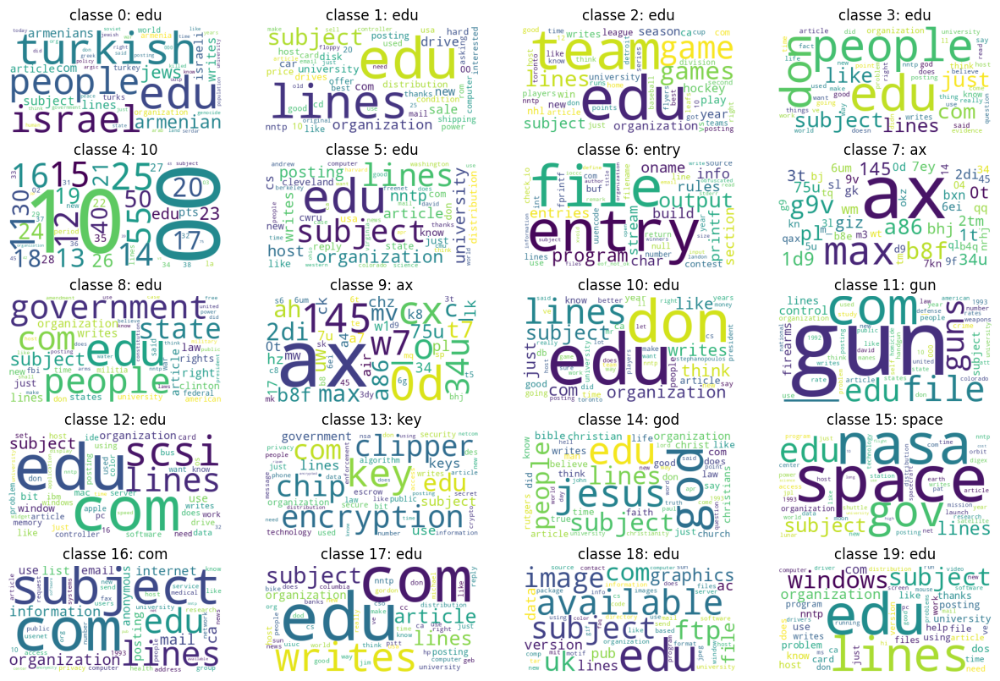

In [ ]:
## Affecter chaque document à une classe
lda_label_pred=np.argmax(U_lda, axis=1) # recuperer l'indice correspondant aux champs lexical auquel correspond le plus chaque document

X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(lda_label_pred)
classes=set(lda_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  ## Analyser les mots les plus importants de chaque cluster
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  ## Donner un nom a chaque classe : nous prenons le mot le pls fréqeunt de la classe
  nom_classe=list(sorted_dict_words_freq.keys())[0]

  sorted_dict_words_freq
  ## Appliquer un wordcloud pour chaque classe
  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre="classe "+str(classe)+": "+nom_classe
  ax[i].set_title(titre)

## Analyse quantitative

In [ ]:
# Evaluation du clustering
purity_lda = get_purity(true_label, lda_label_pred, 20)
print("LDA Cluster Purity:", purity_lda)

rand_lda = rand_score(true_label, lda_label_pred)
print("LDA Rand Score:", rand_lda)

adjusted_rand_lda = adjusted_rand_score(true_label, lda_label_pred)
print("LDA Adjusted Rand Score:", adjusted_rand_lda)


LDA Cluster Purity: 0.3137705497613576
LDA Rand Score: 0.884783190680419
LDA Adjusted Rand Score: 0.12082572631843923


Les scores obtenus par LSA et LDA sont similaires

## LDA-viz

## Utiliser LDA comme prétraitement des données pour un clustering avec Kmeans

##### Analyse qualitative

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


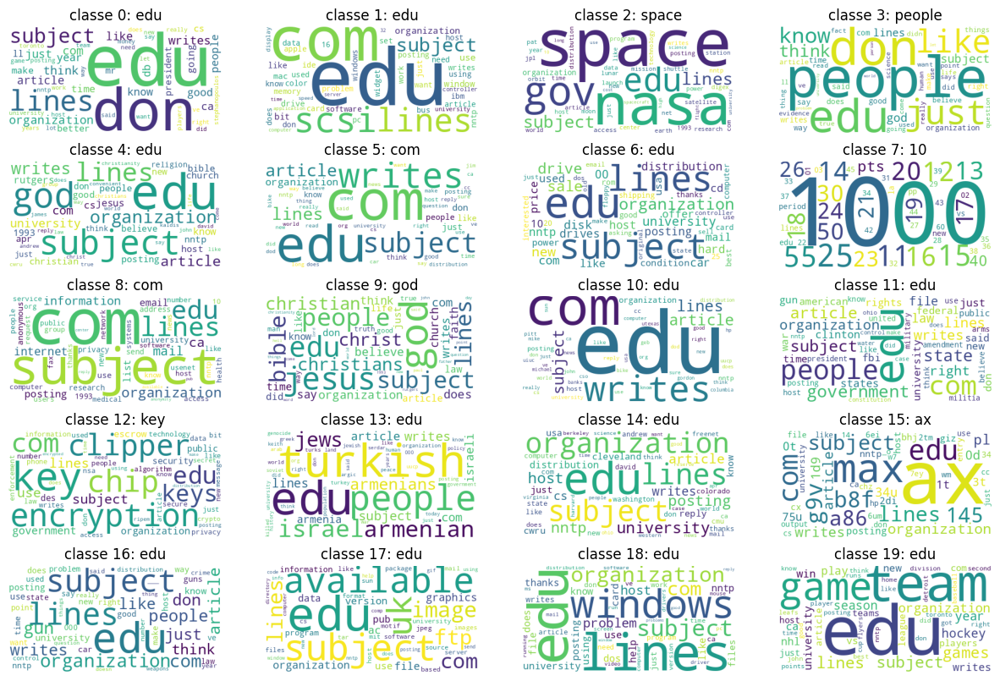

In [ ]:
kmeans_lda = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(U_lda)
lda_kmeans_label_pred=kmeans_lda.predict(U_lda)

X=pd.DataFrame(newsgroups_train.data)
Y=pd.DataFrame(lda_kmeans_label_pred)
classes=set(lda_kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
  ## Analyser les mots les plus importants de chaque cluster
  X_classe=X[Y.iloc[:,0]==i]
  vectorizer = CountVectorizer(max_features=N, stop_words='english')
  X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
  X_names= vectorizer.get_feature_names_out()
  dict_words_freq=dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
  sorted_dict_words_freq=dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

  ## Donner un nom a chaque classe : nous prenons le mot le pls fréqeunt de la classe
  nom_classe=list(sorted_dict_words_freq.keys())[0]

  ## Appliquer un wordcloud pour chaque classe
  wordcloud= WordCloud(background_color='white', stopwords = STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
  ax[i].imshow(wordcloud)
  ax[i].axis("off")
  titre="classe "+str(classe)+": "+nom_classe
  ax[i].set_title(titre)

##### Analyse quantitative

In [ ]:
pred_label= lda_kmeans_label_pred
true_label = newsgroups_train.target

purity = get_purity(true_label, pred_label, 20)
print("LDA_Kmeans Cluster Purity:", purity)

rand= rand_score(true_label, pred_label)
print("LDA_Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, pred_label)
print("LDA_Kmeans Adjusted Rand Score:", adjusted_rand)

LDA_Kmeans Cluster Purity: 0.32234399858582286
LDA_Kmeans Rand Score: 0.9089228148268778
LDA_Kmeans Adjusted Rand Score: 0.138857344504512


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Un prétraitement avec LSA reste une meilleure approche que LDA

#### Tester avec une normalisation l2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(




LDA_l2Norm_Kmeans Cluster Purity: 0.32729361852572036
LDA_l2Norm_Kmeans Rand Score: 0.9049087918725004
LDA_l2Norm_Kmeans Adjusted Rand Score: 0.14297118721883464


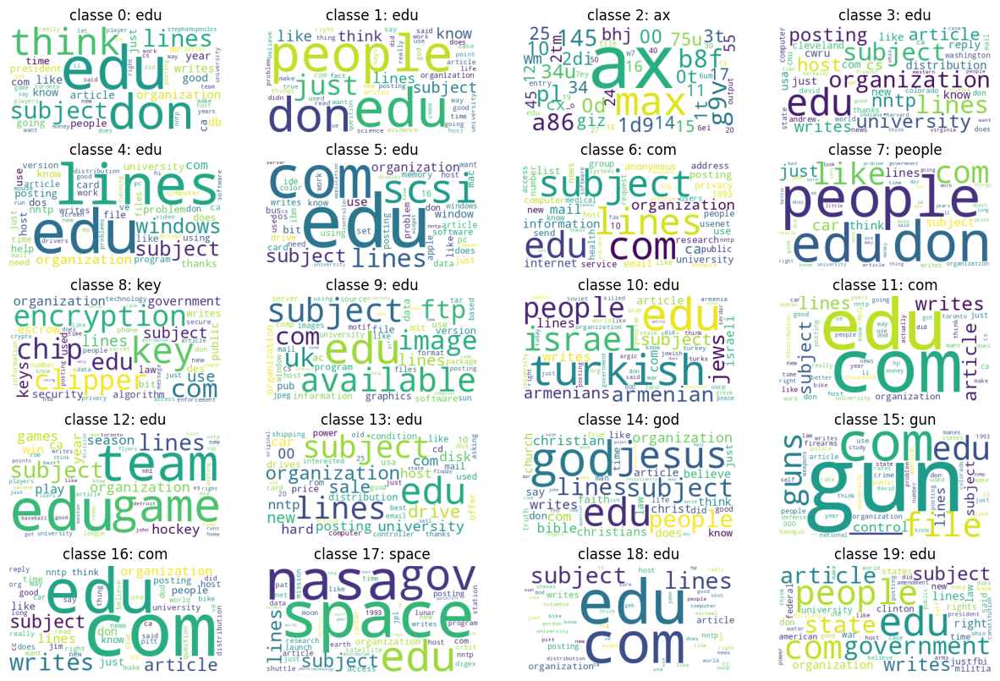

In [ ]:
#normalisation ℓ2 des lignes de la matrice U_lda
normalizer = Normalizer(norm='l2', copy=False)
U_normalized_lda = normalizer.fit_transform(U_lda)

#appliquer K-Means sur U_normalized_lda
kmeans_l2 = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(U_normalized_lda)
lda_l2_kmeans_label_pred = kmeans_l2.labels_

#Analyse qualitative
print()
X = pd.DataFrame(newsgroups_train.data)
Y = pd.DataFrame(lda_l2_kmeans_label_pred)
classes = set(lda_l2_kmeans_label_pred)
fig, ax = plt.subplots(nrows=5, ncols=4, figsize=(15,10))
ax = ax.flatten()

for i, classe in zip(range(len(classes)), classes):
    ## Analyser les mots les plus importants de chaque cluster
    X_classe = X[Y.iloc[:,0]==i]
    vectorizer = CountVectorizer(max_features=N, stop_words='english')
    X_vect = vectorizer.fit_transform(X_classe.iloc[:,0])
    X_names = vectorizer.get_feature_names_out()
    dict_words_freq = dict(zip(X_names, X_vect.sum(axis=0).tolist()[0]))
    sorted_dict_words_freq = dict(sorted(dict_words_freq.items(), key=lambda item:item[1], reverse=True))

    ## Donner un nom à chaque classe : nous prenons le mot le plus fréquent de la classe
    nom_classe = list(sorted_dict_words_freq.keys())[0]

    ## Appliquer un wordcloud pour chaque classe
    wordcloud = WordCloud(background_color='white', stopwords=STOPWORDS, max_words=N).generate_from_frequencies(frequencies=sorted_dict_words_freq)
    ax[i].imshow(wordcloud)
    ax[i].axis("off")
    titre = "classe "+str(classe)+": "+nom_classe
    ax[i].set_title(titre)

#Analyse quantitative
print()
true_label = newsgroups_train.target

purity = get_purity(true_label, lda_l2_kmeans_label_pred, 20)
print("LDA_l2Norm_Kmeans Cluster Purity:", purity)

rand = rand_score(true_label, lda_l2_kmeans_label_pred)
print("LDA_l2Norm_Kmeans Rand Score:", rand)

adjusted_rand = adjusted_rand_score(true_label, lda_l2_kmeans_label_pred)
print("LDA_l2Norm_Kmeans Adjusted Rand Score:", adjusted_rand)


Les scores obtenus avec LSA restent légèrement meilleurs

#### Visualisation avec TSNE

In [ ]:
# t-SNE from the U matrix computed by LSA
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U_lda)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.001s...
[t-SNE] Computed neighbors for 11314 samples in 1.072s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.068456
[t-SNE] Computed cond

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-59-7dc446f561b9>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('hsv', 20)
<ipython-input-59-7dc446f561b9>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet', 20)


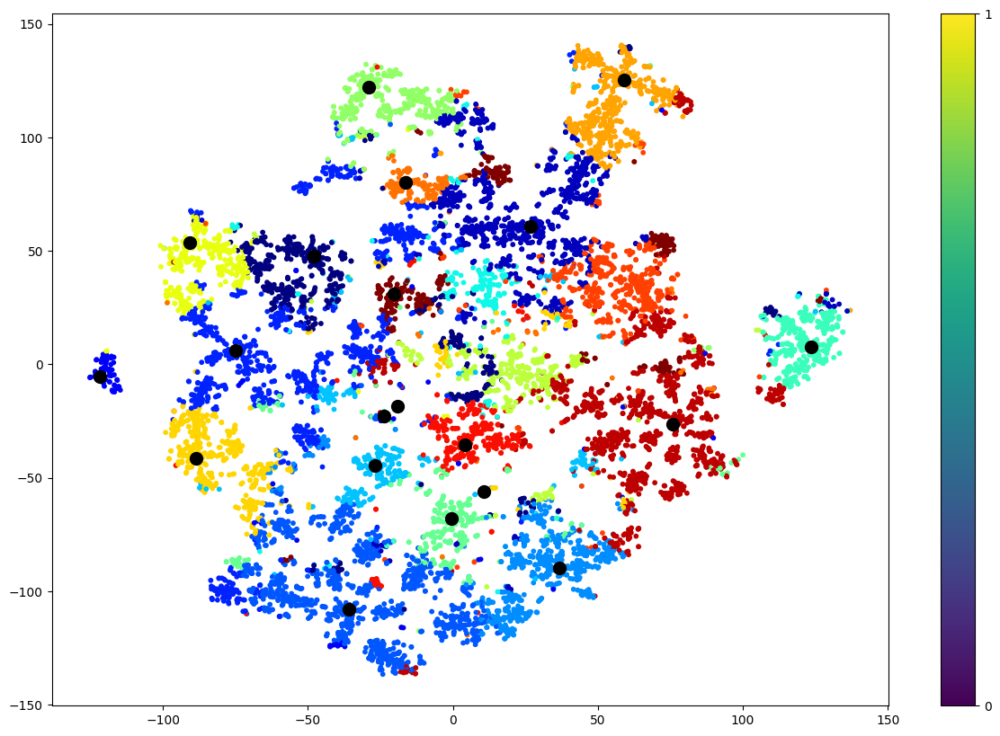

In [ ]:
NN2cluster = np.argmax(np.abs(U_normalized_lda), axis=0)
#import seaborn as sns
import matplotlib.cm as cm
cmap = cm.tab20
cmap = cm.get_cmap('hsv', 20)
cmap = cm.get_cmap('jet', 20)
#cmap = cm.tab20

plt.figure(figsize=(15,10))
plt.scatter(tsne_mat[:,0],tsne_mat[:,1], c=Y, cmap=cmap, s=10)
plt.scatter(tsne_mat[NN2cluster[:],0],tsne_mat[NN2cluster[:],1], c='black', s=100)
#plt.scatter(tsne_mat[NN2cluster2[:],0],tsne_mat[NN2cluster2[:],1], c='red', s=100)
plt.colorbar(ticks=range(20))

# Performances evaluation

**Compare the different approaches wrt three quantitative metrics.**

(voir les commentaire en dessous de chaque analyse quantitative)